# JamUNet model trained with the spatial dataset - testing and visualisation

This notebook was used for testing the model, computing the metric scores, and visualising the predictions.

In [1]:
%cd /workspace/dsaie-morph2
%pwd

/workspace/dsaie-morph2


'/workspace/dsaie-morph2'

In [2]:
# reload modules to avoid restarting the notebook every time these are updated

%load_ext autoreload
%autoreload 2

In [3]:
# import modules 

import torch 
import copy
import time

from torch.utils.data import DataLoader

from model.train_eval import * 
from preprocessing.dataset_generation import create_full_dataset

from postprocessing.metrics import *
from postprocessing.plot_results import *
from postprocessing.save_results import load_model

# Enable interactive widgets in Jupyter Notebook
%matplotlib inline
%matplotlib widget

In [4]:
# # set the device where operations are performed
# # if only one GPU is present you might need to remove the index "0" 
# # torch.device('cuda:0') --> torch.device('cuda') / torch.cuda.get_device_name(0) --> torch.cuda.get_device_name() 

# if torch.cuda.is_available():
#     device = torch.device('cuda:0')
#     print("CUDA Device Count: ", torch.cuda.device_count())
#     print("CUDA Device Name: ", torch.cuda.get_device_name(0))
# else:
#     device = 'cpu'
    
# print(f'Using device: {device}')

device = 'cpu'

In [5]:
# set common keys required for functions

train = 'training'
val = 'validation'
test = 'testing'

In [6]:
# load all datasets

# by default March images are used - if another month is used change the number (available months: 1-4)
dataset_path = r'data/satellite/dataset_month3' 

dtype=torch.float32

val_set = create_full_dataset(val, dir_folders=dataset_path, device=device, dtype=dtype)
test_set = create_full_dataset(test, dir_folders=dataset_path, device=device, dtype=dtype)

/workspace/miniconda3/envs/braided-gpu/lib/python3.11/site-packages/osgeo/gdal.py:606: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


**<span style="color:red">Attention!</span> Always remember to load the correct <code>save_path</code> file before running the following cells, in order to match all keys successfully when loading the model.**

In [8]:
# load model with min val loss

save_path_loss = rf"model/losses_metrics/01. 25D/UNet25D_bloss_spatial_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.pth"

In [9]:
# load model with max recall

save_path_recall = rf"model/losses_metrics/01. 25D/UNet25D_brecall_spatial_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.pth"

In [11]:
# load JamUNet architecture

from model.st_unet.st_unet import *
# from model.st_unet.st_unet_mod_ver2 import *
from model.st_unet.st_unet_25D import *

n_channels = test_set[0][0].shape[0]
n_classes = 1
init_hid_dim = 8
kernel_size = 3
pooling = 'max'
temporal_kernel = test_set[0][0].shape[0]


model_loss = UNet25D(n_channels=1, n_classes=n_classes, init_hid_dim=init_hid_dim, 
               kernel_size=kernel_size, temporal_kernel=temporal_kernel,pooling=pooling, bilinear=False, drop_channels=False)

# model25bot = UNet25D_bottleneck(n_channels=1, n_classes=n_classes, init_hid_dim=init_hid_dim, 
#                kernel_size=kernel_size, temporal_kernel=temporal_kernel,pooling=pooling, bilinear=False, drop_channels=False)

In [12]:
# deepcopy the model to avoid overwriting

model_recall = copy.deepcopy(model_loss)

In [13]:
loss_f = 'BCE'
batch_size = 16

# dataloaders to input data to the model in batches -- see note above
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

In [14]:
# load model with min val loss

load_model(model_loss, save_path_loss, device=device)

<All keys matched successfully>

In [15]:
sample = 15

input_img = test_set[sample][0].unsqueeze(0).to('cpu')
target_img = test_set[sample][1].to('cpu')

prediction = model_loss(input_img).detach().to('cpu')
# check that the predictions from the same sample are different from those of the max recall model
print(prediction) 

tensor([[[0.0173, 0.0036, 0.0054,  ..., 0.0084, 0.0046, 0.0320],
         [0.0041, 0.0010, 0.0035,  ..., 0.0036, 0.0016, 0.0076],
         [0.0041, 0.0013, 0.0036,  ..., 0.0040, 0.0017, 0.0083],
         ...,
         [0.0025, 0.0004, 0.0016,  ..., 0.0015, 0.0007, 0.0040],
         [0.0019, 0.0002, 0.0008,  ..., 0.0006, 0.0004, 0.0026],
         [0.0144, 0.0024, 0.0041,  ..., 0.0035, 0.0028, 0.0200]]])


In [16]:
# load model with max recall

load_model(model_recall, save_path_recall, device=device)

<All keys matched successfully>

In [17]:
sample = 15

input_img = test_set[sample][0].unsqueeze(0).to('cpu')
target_img = test_set[sample][1].to('cpu')

prediction = model_recall(input_img).detach().to('cpu')
# check that the predictions from the same sample are different from those of the min loss model
print(prediction)

tensor([[[0.0156, 0.0045, 0.0096,  ..., 0.0110, 0.0039, 0.0311],
         [0.0038, 0.0011, 0.0054,  ..., 0.0039, 0.0010, 0.0073],
         [0.0070, 0.0034, 0.0174,  ..., 0.0121, 0.0025, 0.0143],
         ...,
         [0.0032, 0.0007, 0.0047,  ..., 0.0040, 0.0010, 0.0062],
         [0.0014, 0.0002, 0.0010,  ..., 0.0008, 0.0003, 0.0030],
         [0.0110, 0.0018, 0.0048,  ..., 0.0039, 0.0023, 0.0172]]])


In [19]:
# load losses and metrics saved during training and validation for plotting

losses_metrics = load_losses_metrics(r'model/losses_metrics/01. 25D/UNet25D_spatial_losses&metrics_month3_4dwns_8ihiddim_3ker_maxpool_0.05ilr_15step_0.75gamma_16batch_100epochs_0.5wthr.csv')
train_losses, val_losses = losses_metrics['Training loss'], losses_metrics['Validation loss']
metrics = [losses_metrics[losses_metrics.columns[i]].tolist() for i in range(2, len(losses_metrics.columns))]

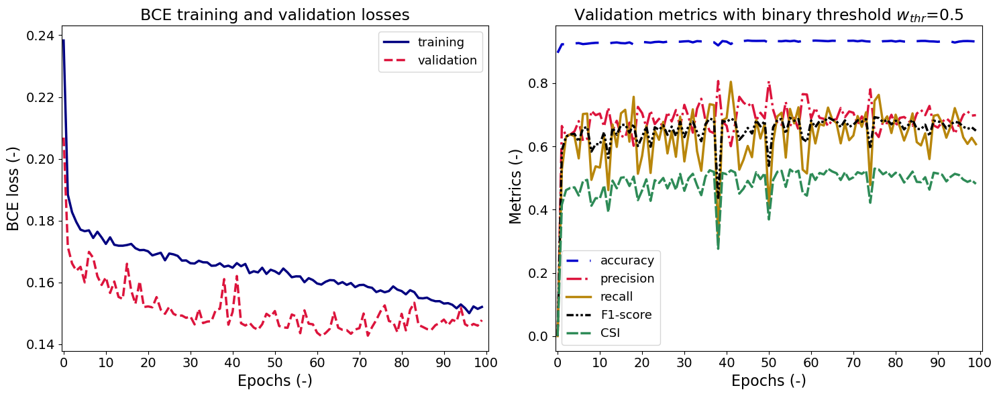

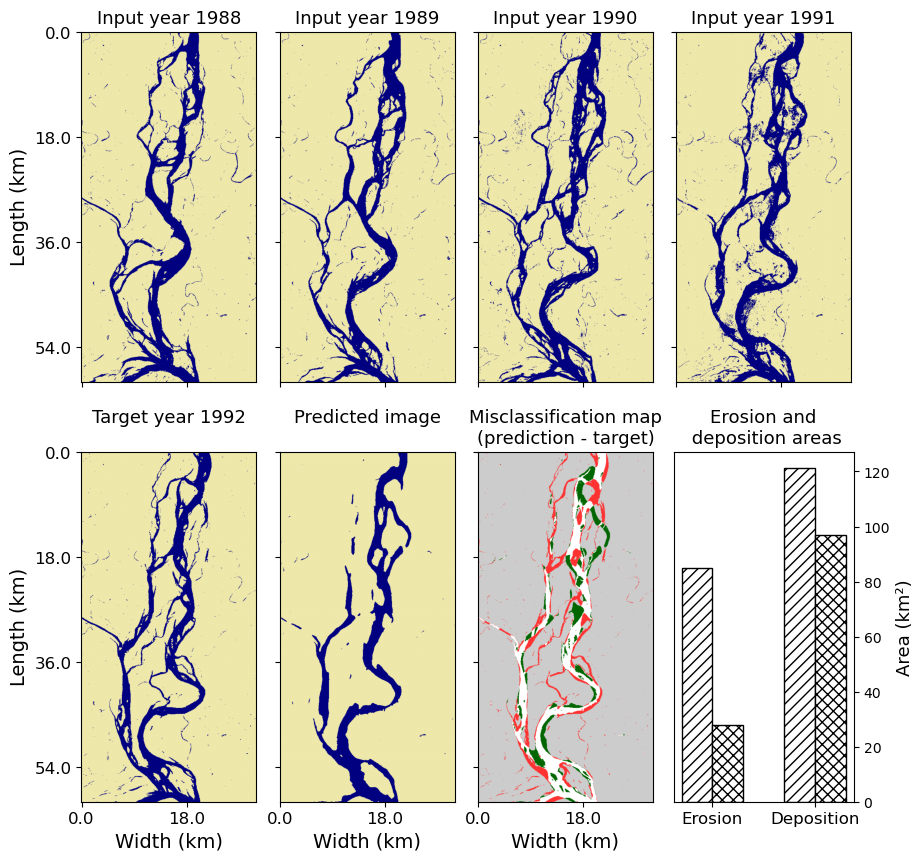

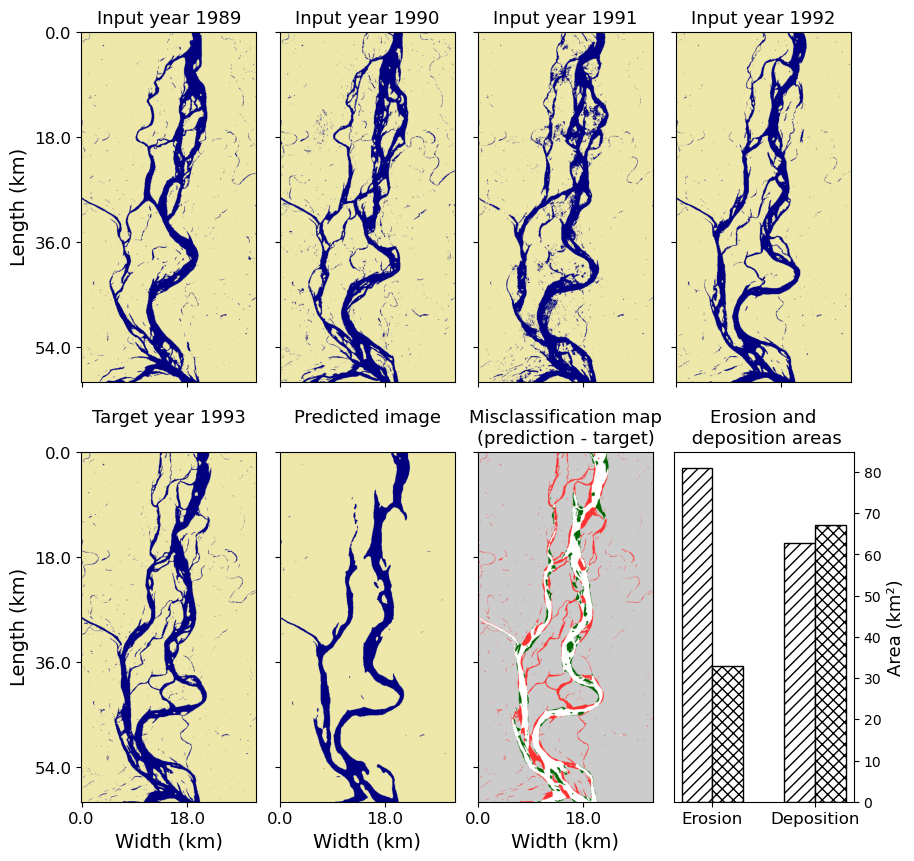

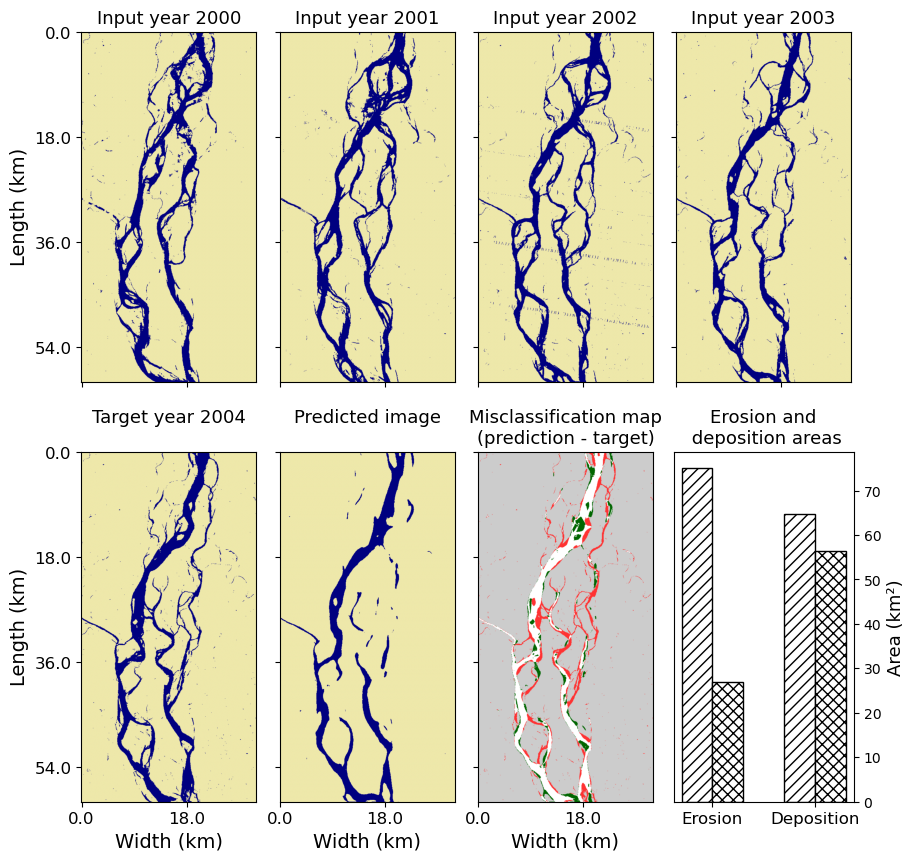

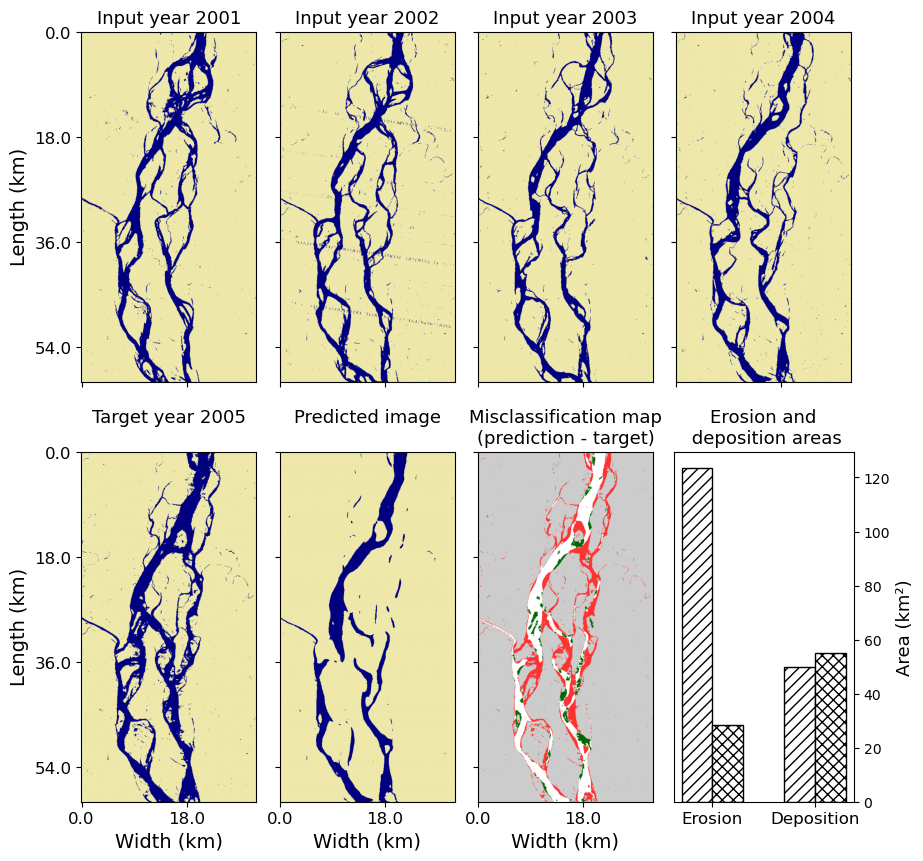

...

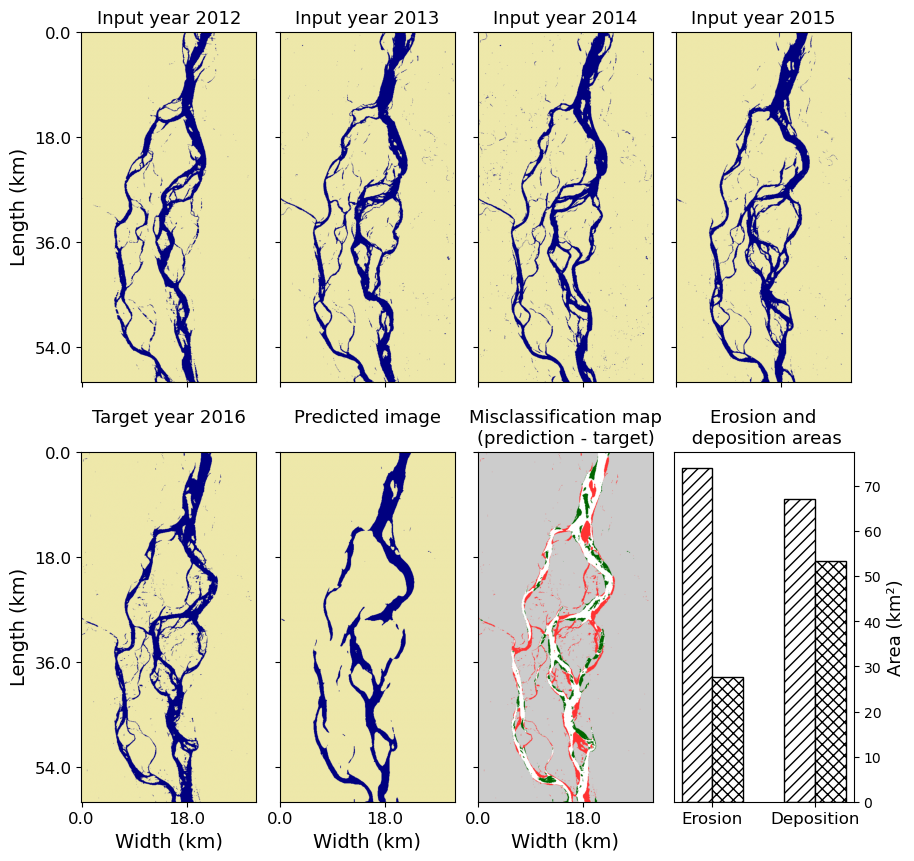

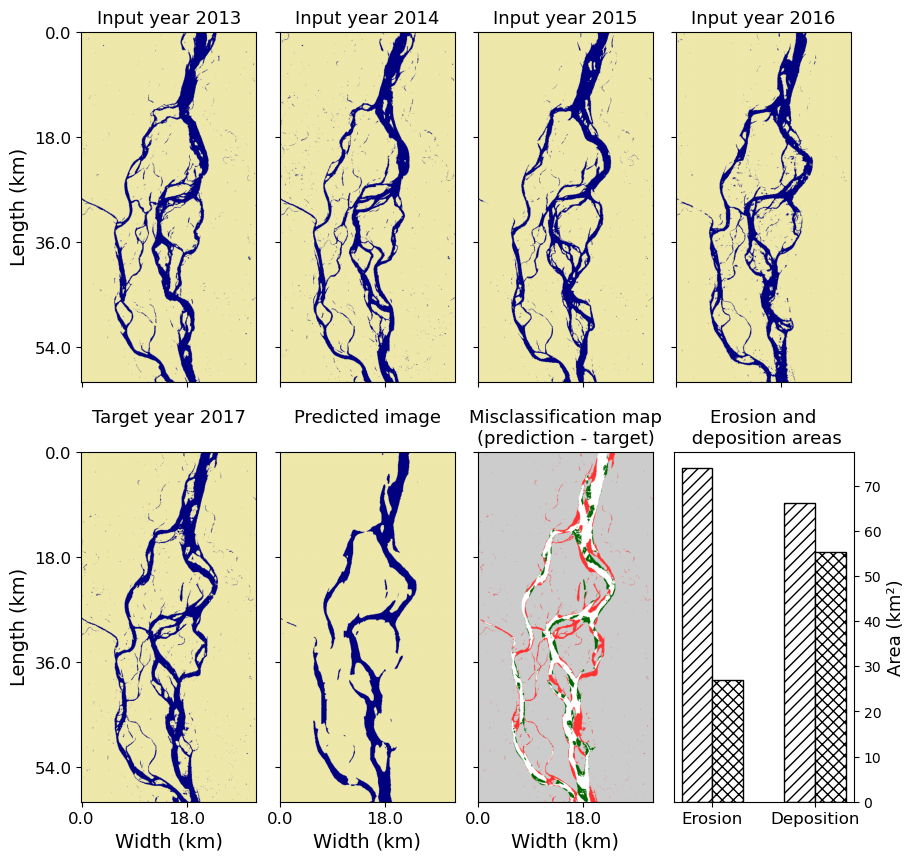

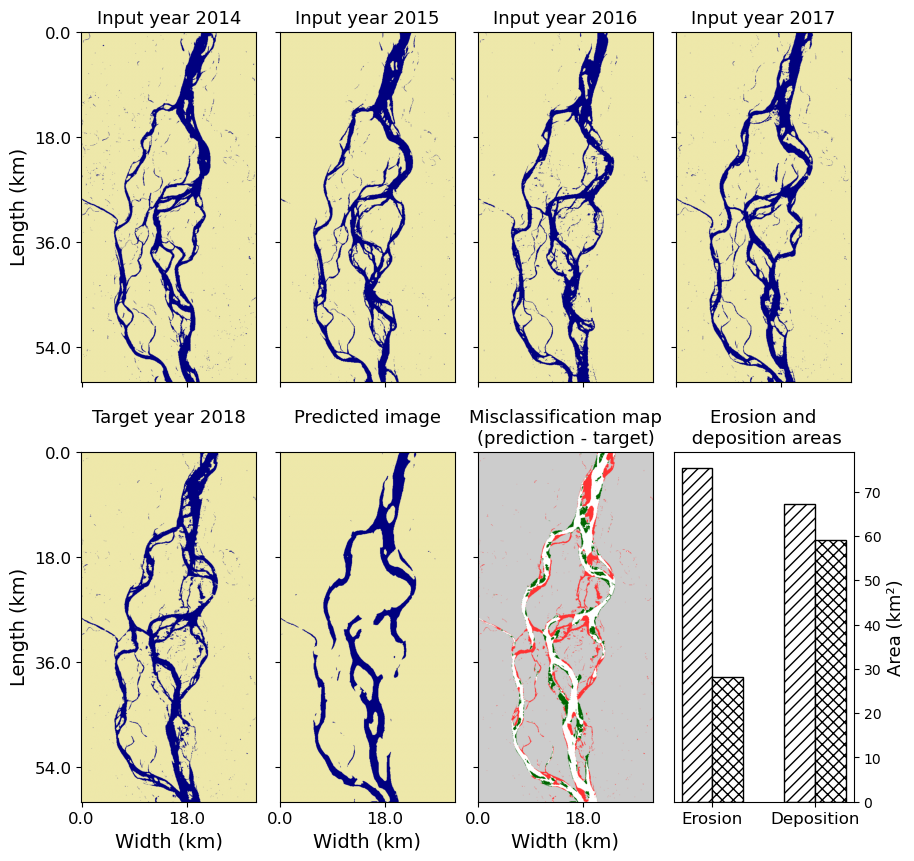

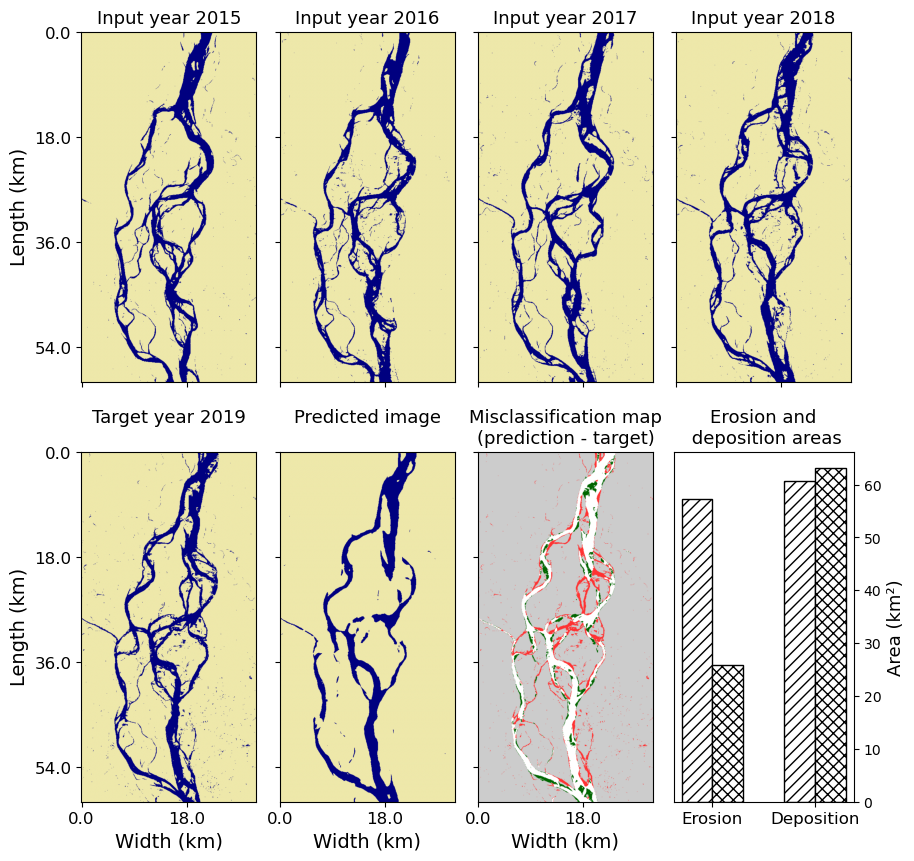

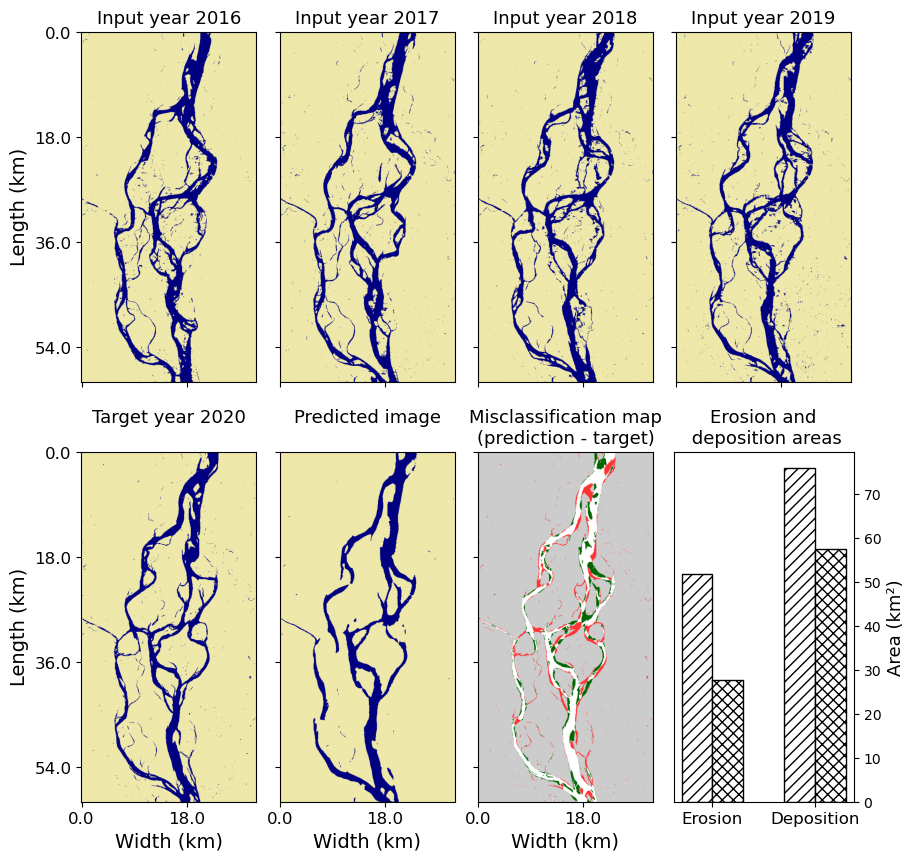

IndexError: list index out of range

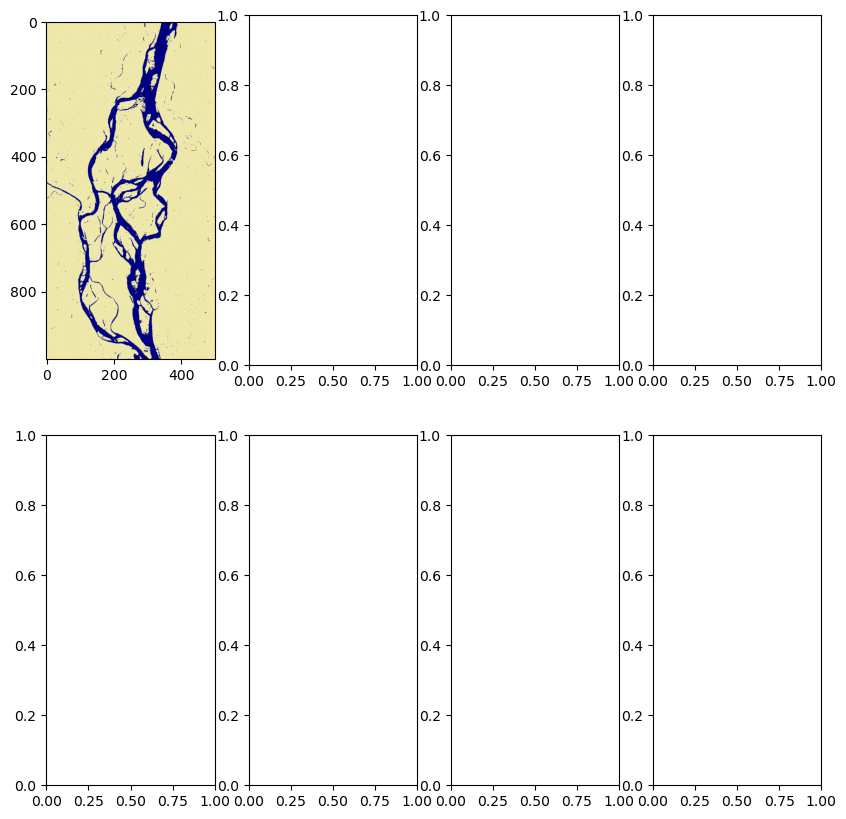

In [25]:
# Wrapper class to fix output shape
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    
    def forward(self, x):
        out = self.model(x)
        # Add channel dimension: [B, H, W] -> [B, 1, H, W]
        if out.dim() == 3:
            out = out.unsqueeze(1)
        return out

# Wrap your models
model_loss_wrapped = ModelWrapper(model_loss)
model_recall_wrapped = ModelWrapper(model_recall)

# Now use the wrapped models for plotting
%matplotlib inline
for i in range(len(test_set)):
    show_evolution_nolegend(i, test_set, model_loss_wrapped, device='cpu', save_img=False)

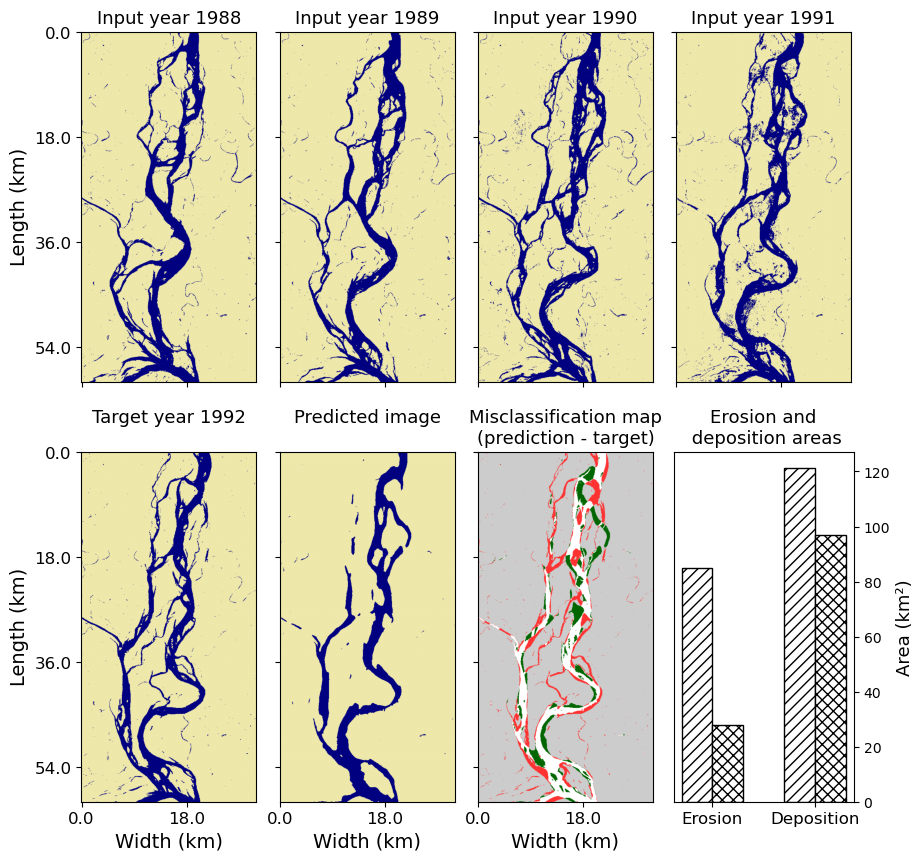

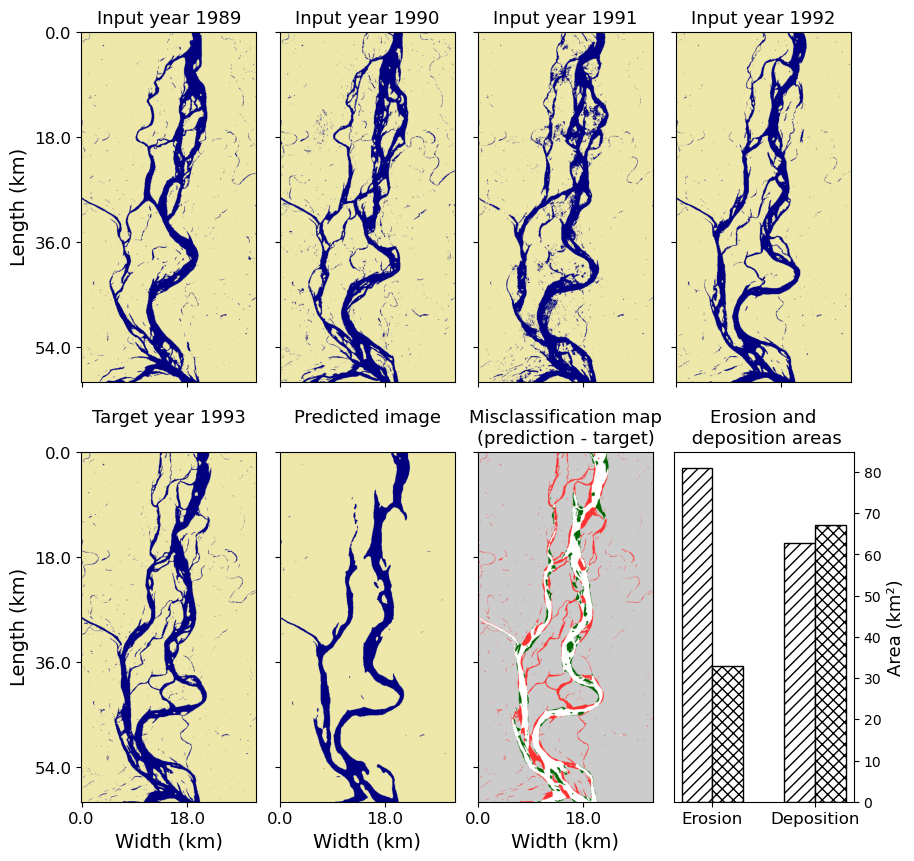

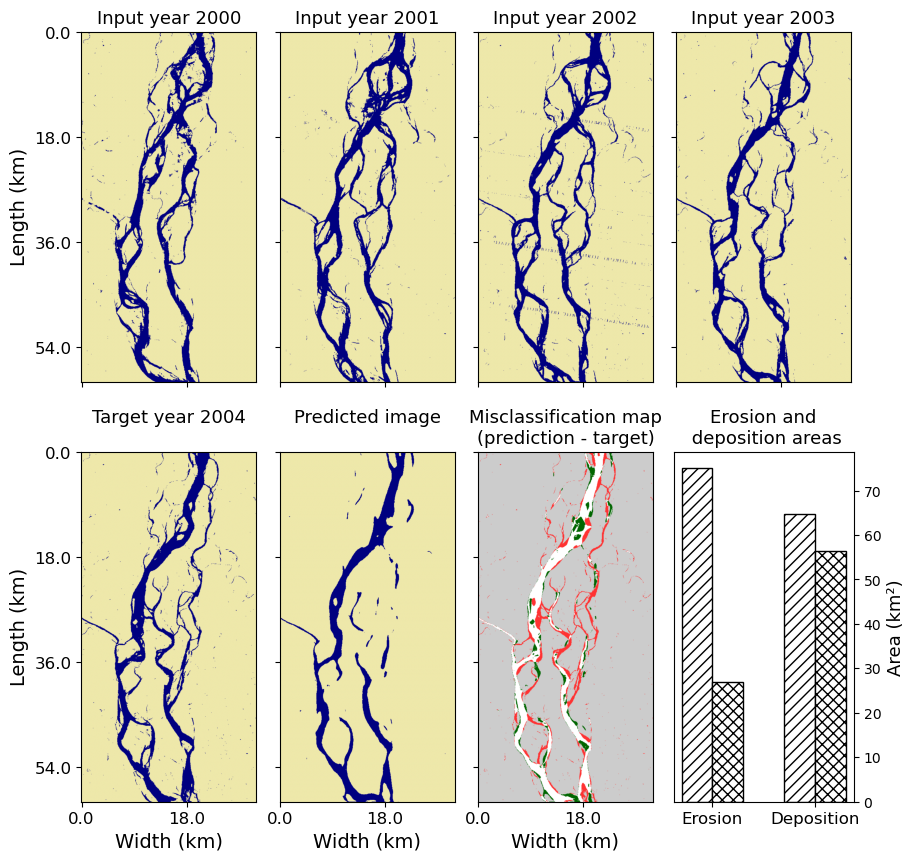

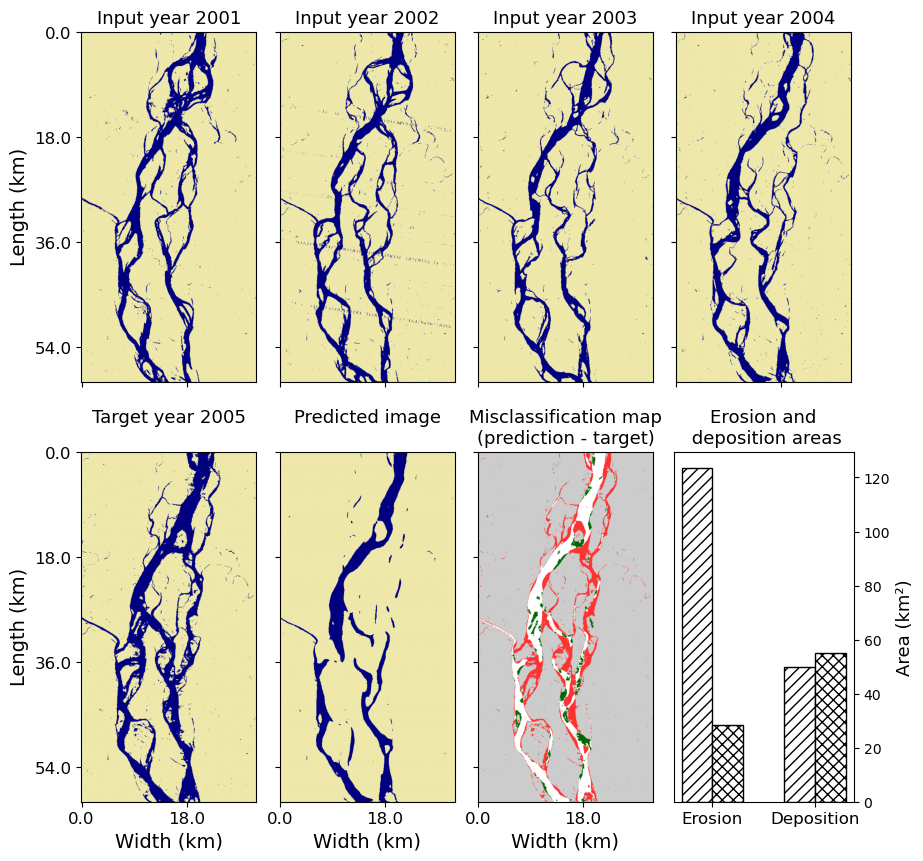

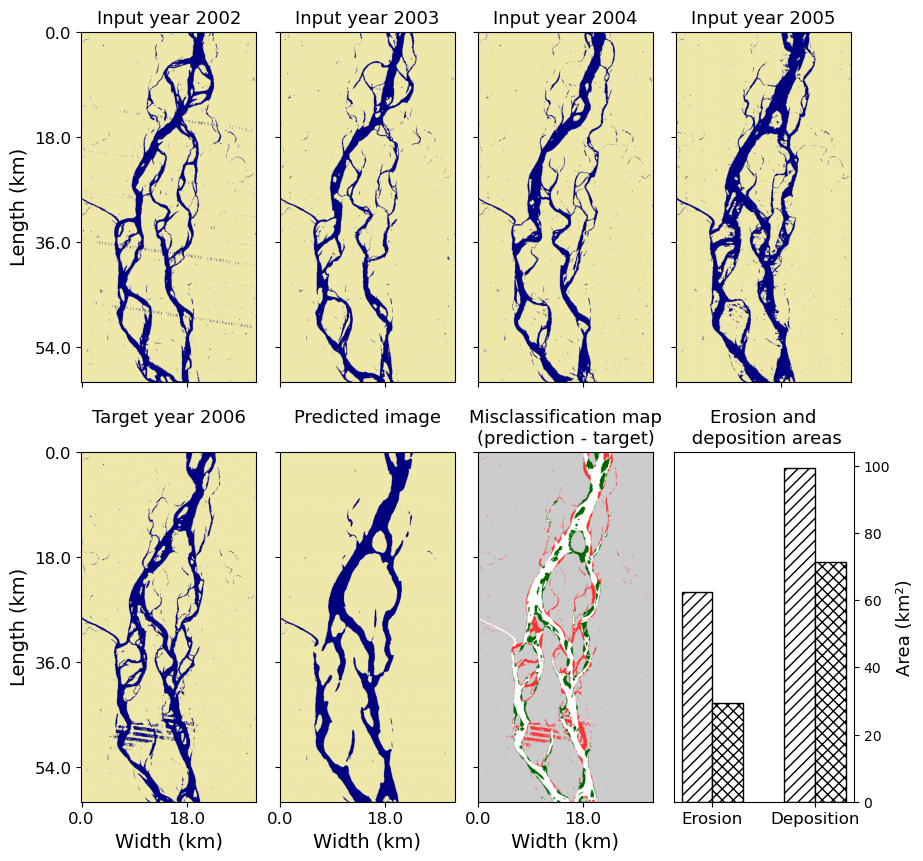

...

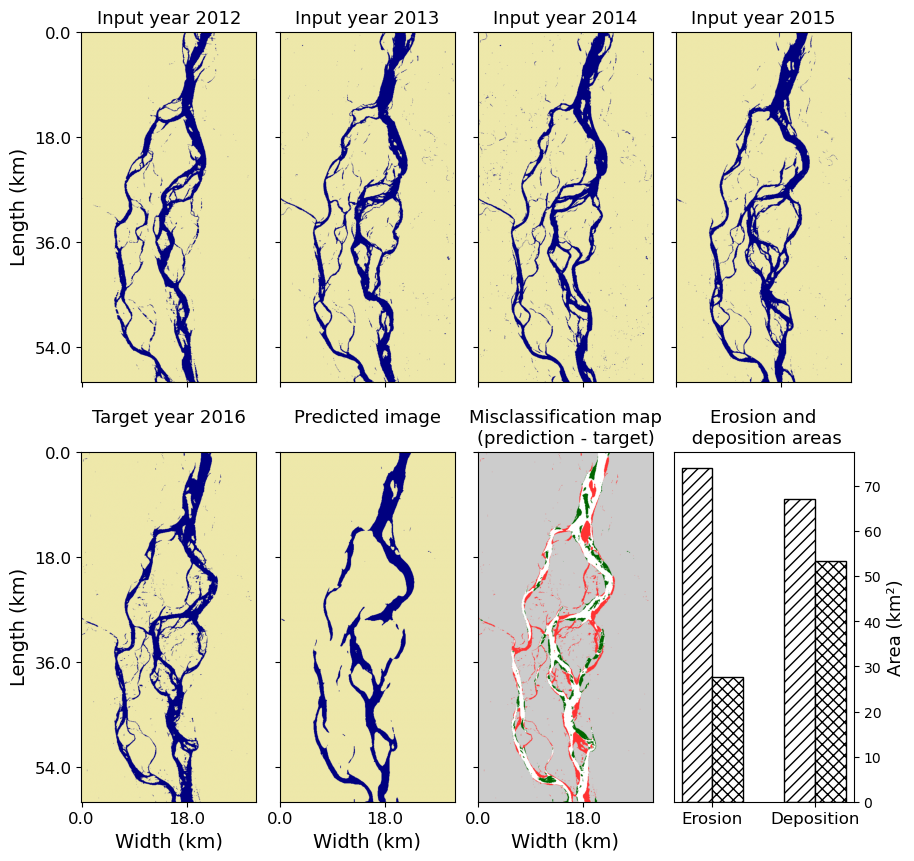

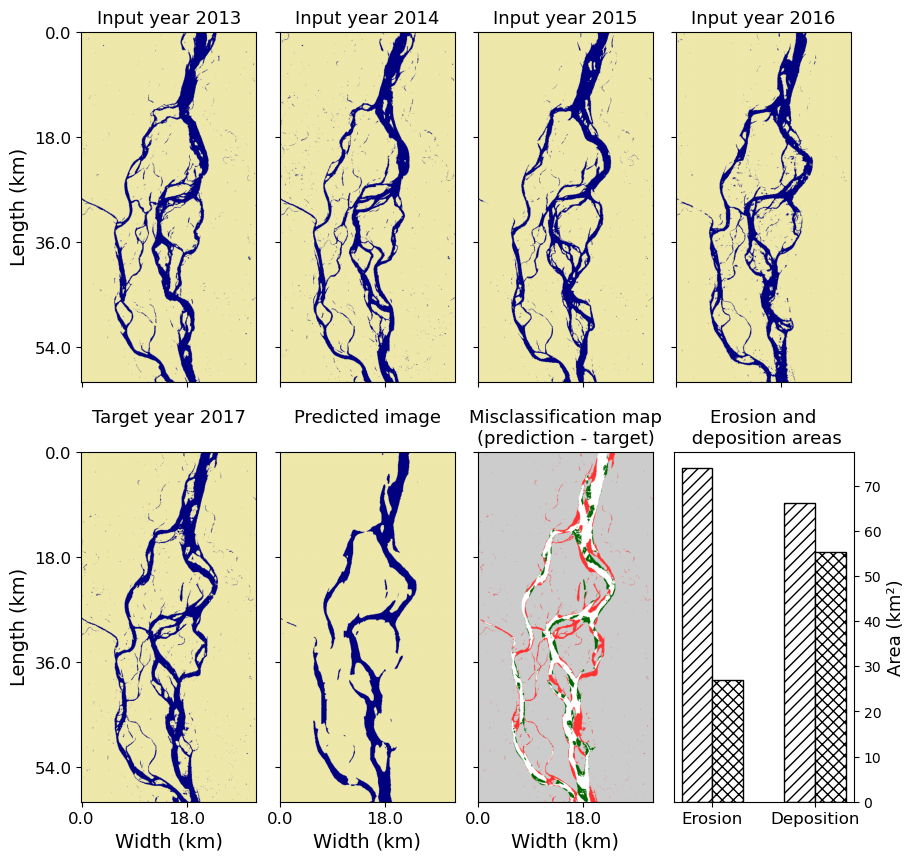

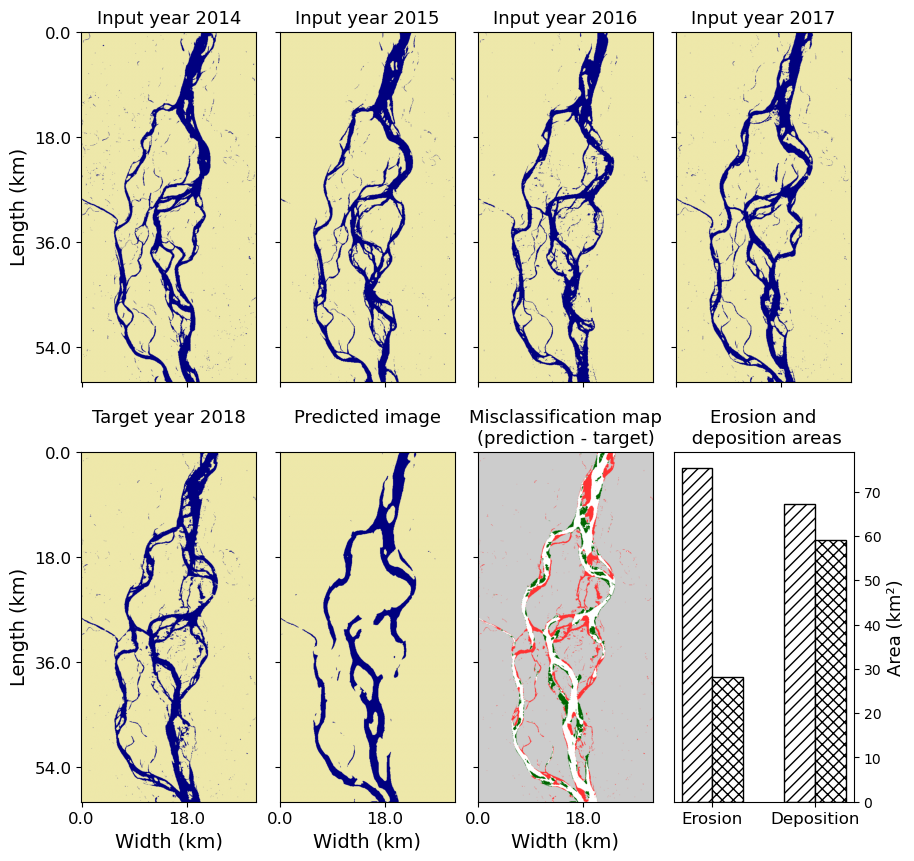

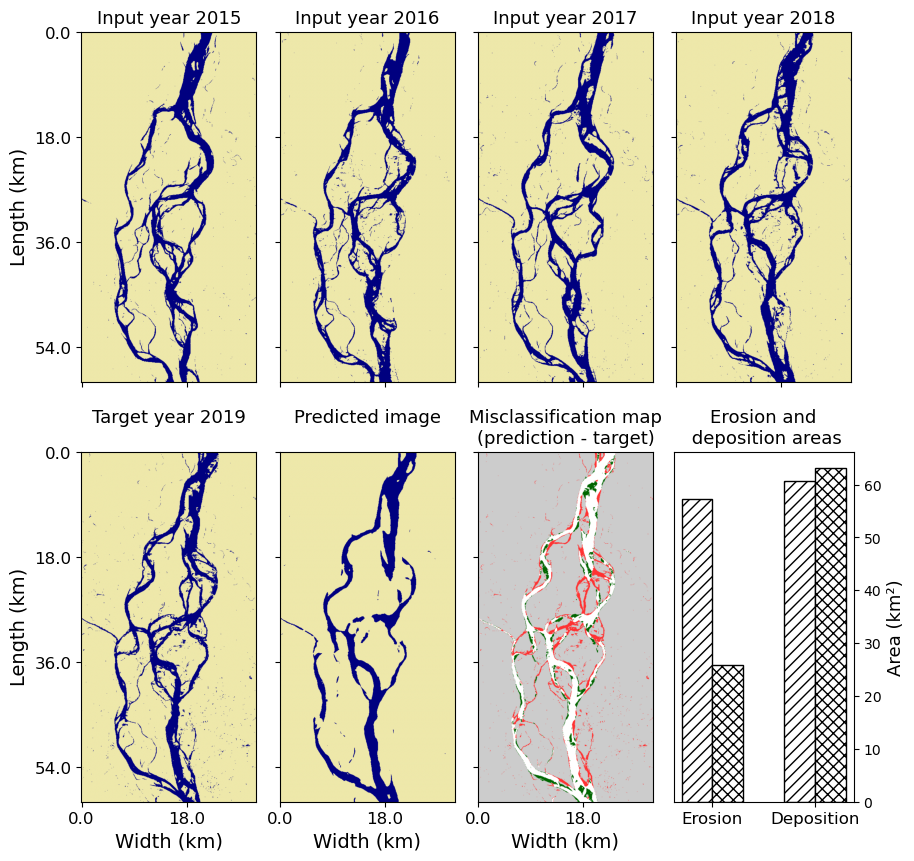

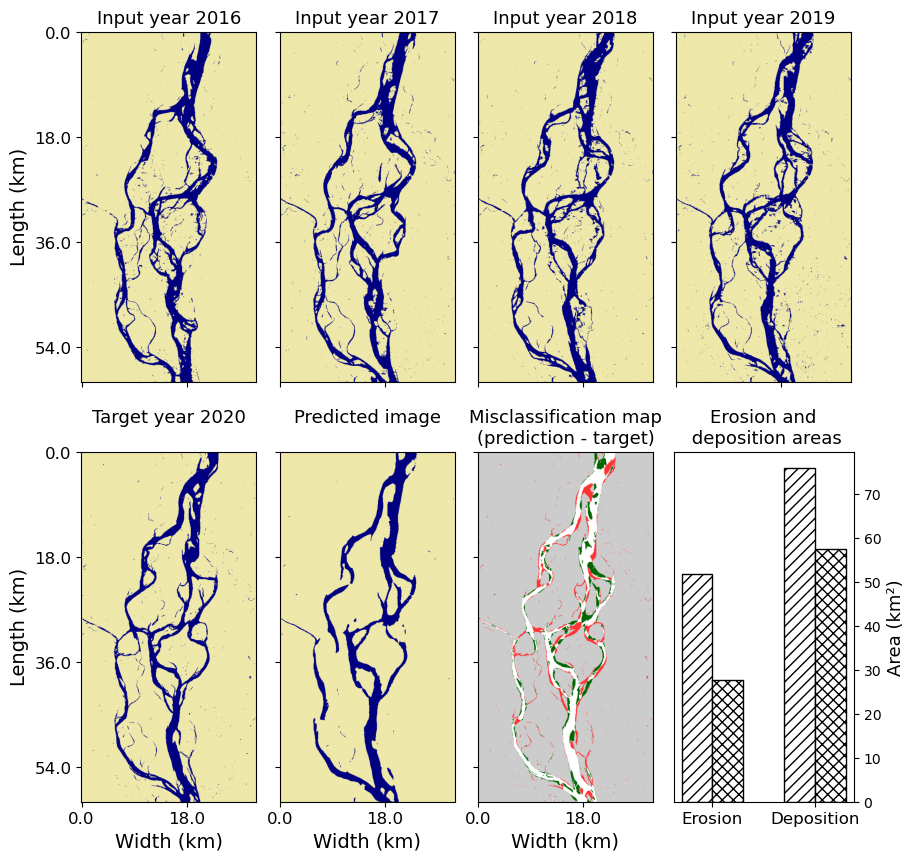

IndexError: list index out of range

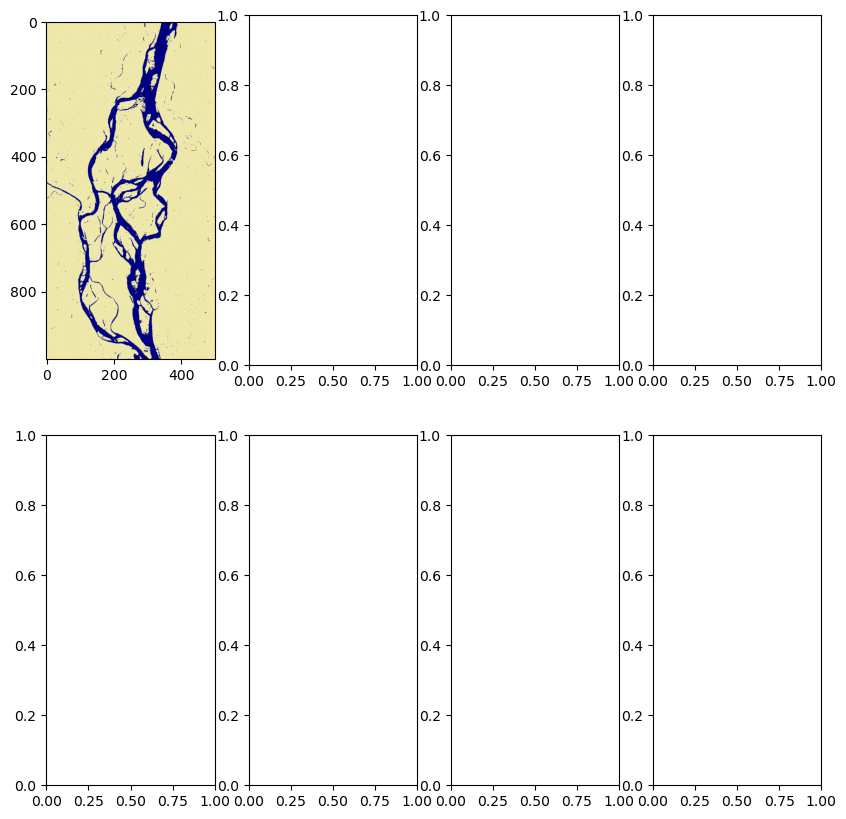

In [39]:
%matplotlib inline
for i in range(len(test_set)):
    show_evolution_nolegend(i, test_set, model_loss_wrapped, device=device, save_img=False)

In [ ]:
%matplotlib inline
for i in range(len(test_set)):
    erosion_sites(model_loss_wrapped, test_set, i, device=device, save_img=False)

In [ ]:
# visualise min loss model predictions with optimal threshold

%matplotlib inline
for i in range(3):
    show_evolution_nolegend(i, test_set, model_loss_wrapped, water_threshold=new_thr, loss_recall='min loss_0.4', device=device, save_img=False)

In [ ]:
%matplotlib inline
for i in range(len(test_set)):
    erosion_sites(model_loss_wrapped, test_set, i, water_threshold=new_thr, device=device, save_img=False)

In [ ]:
%matplotlib inline
get_total_roc_curve(model_loss_wrapped, test_set, device=device, save_img=False)

In [ ]:
%matplotlib inline
get_total_pr_curve(model_loss_wrapped, test_set, device=device, save_img=False);

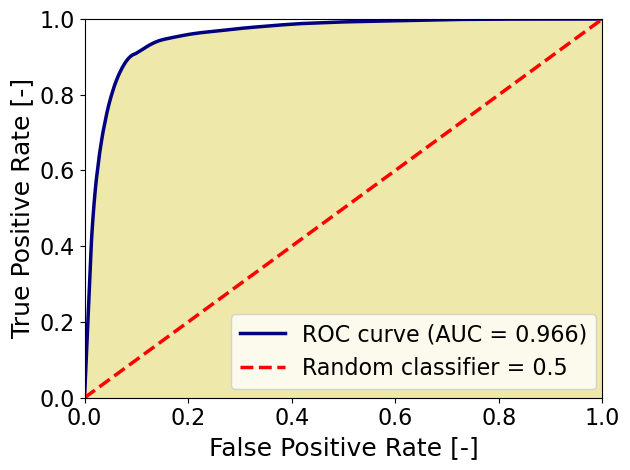

In [30]:
%matplotlib inline
get_total_roc_curve(model_recall, test_set, model_type='max recall', device=device, save_img=True)

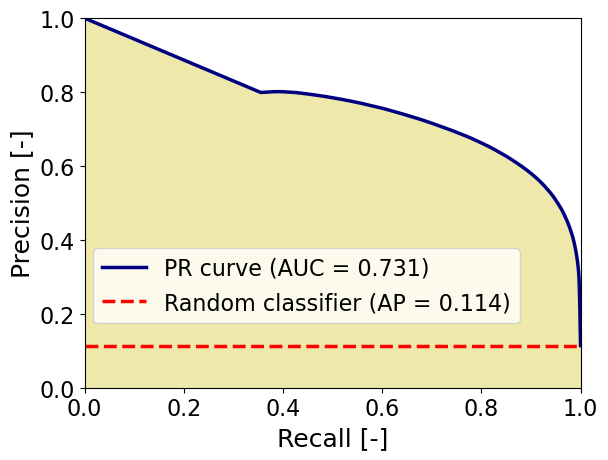

In [31]:
%matplotlib inline
get_total_pr_curve(model_recall, test_set, model_type='max recall', device=device, save_img=True);

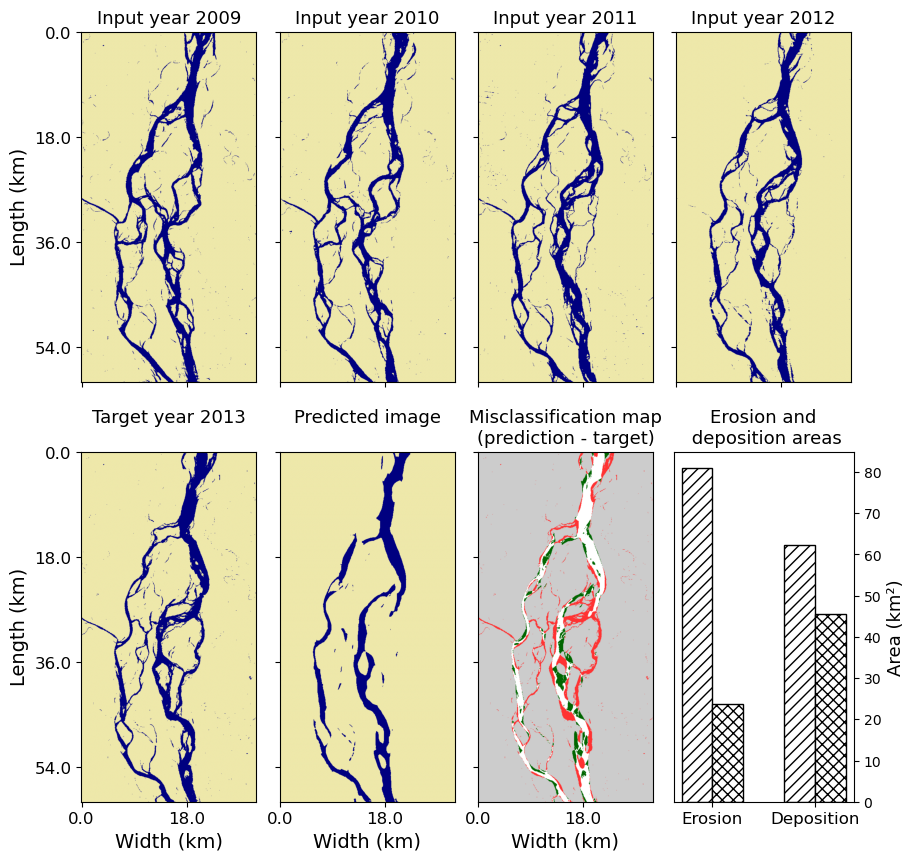

In [40]:
# direct comparison of same sample predictions with original threshold (0.5) and optimal threshold (0.402) 

%matplotlib inline
show_evolution_nolegend(11, test_set, model_loss_wrapped, device=device, save_img=False)

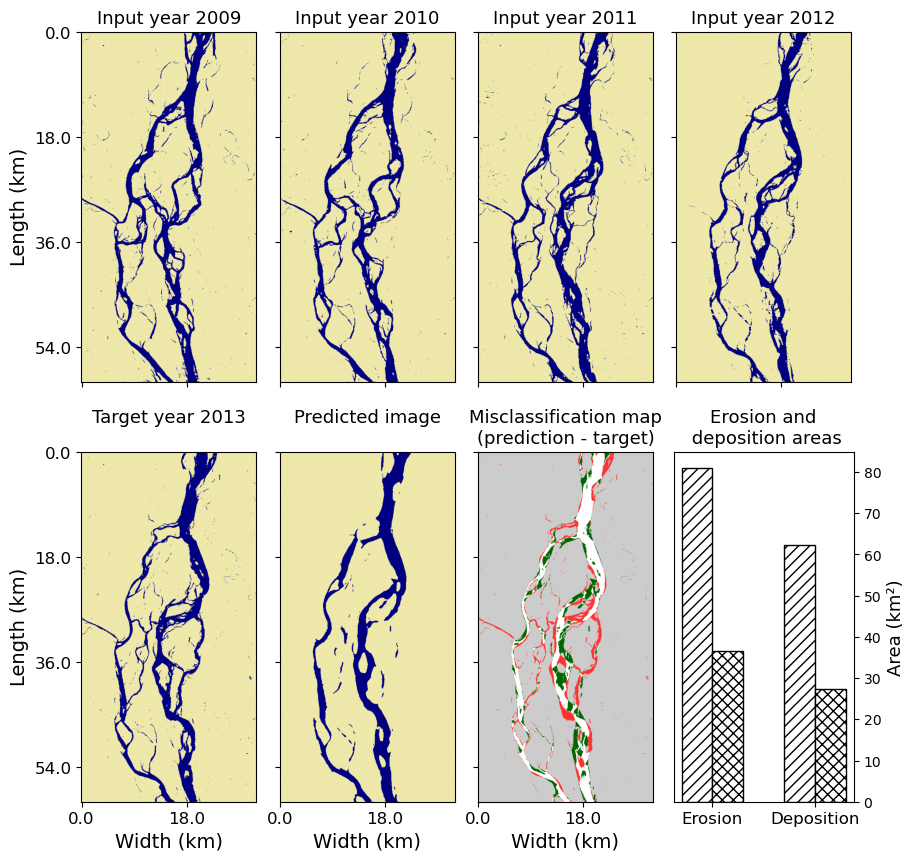

In [41]:
%matplotlib inline
show_evolution_nolegend(11, test_set, model_loss_wrapped, water_threshold=new_thr, device=device, save_img=False)

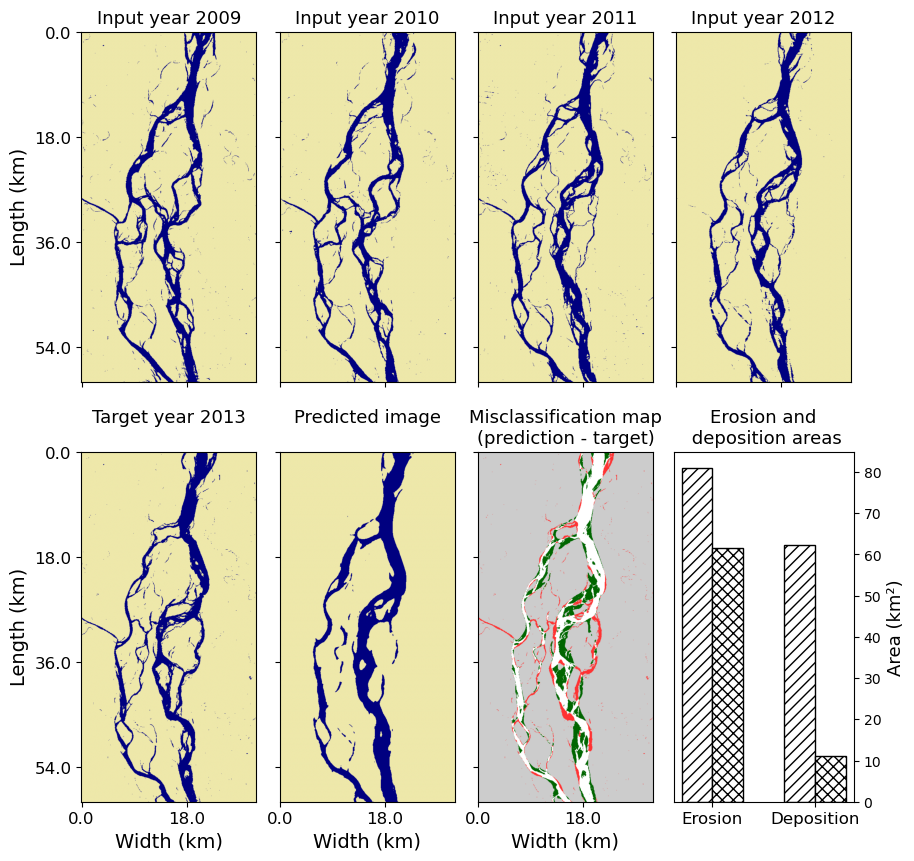

In [47]:
# max recall model predictions

%matplotlib inline
show_evolution_nolegend(11, test_set, model_recall_wrapped, loss_recall='max recall', device=device, save_img=True)

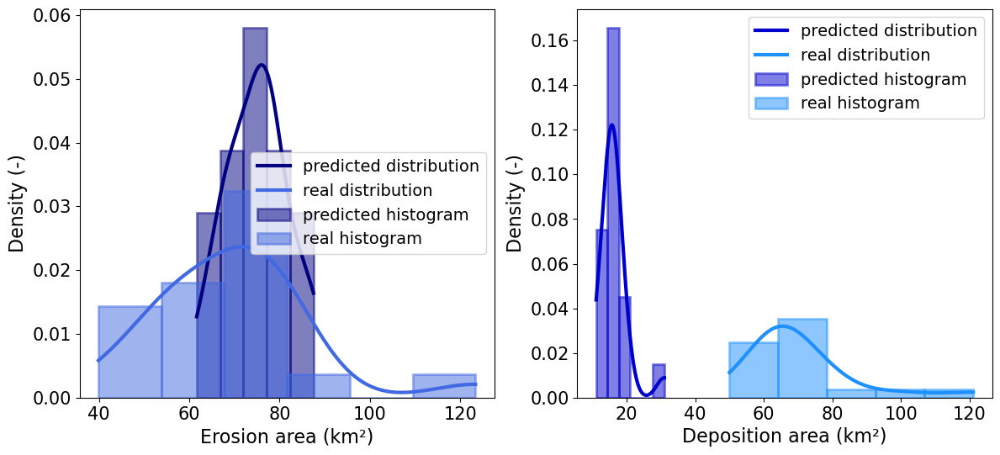

In [48]:
%matplotlib inline
erosion_deposition_distribution(model_recall, test_set, model_type='max_recall', device=device, save_img=True)